In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import numpy as np
plt.style.use('fivethirtyeight')
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import folium
import folium.plugins
from matplotlib import animation,rc
import io
import base64
from IPython.display import HTML, display
import warnings
warnings.filterwarnings('ignore')


In [2]:
global_terror = pd.read_csv("../data/globalterrorismdb_0718dist.csv",encoding='ISO-8859-1')

In [3]:
#컬럼 선택 후 제거 
global_terror.rename(columns={'iyear':'Year','imonth':'Month','iday':'Day','country_txt':'Country','region_txt':'Region','attacktype1_txt':'AttackType','target1':'Target','nkill':'Killed','nwound':'Wounded','summary':'Summary','gname':'Group','targtype1_txt':'Target_type','weaptype1_txt':'Weapon_type','motive':'Motive'},inplace=True)
global_terror=global_terror[['Year','Month','Day','Country','Region','city','latitude','longitude','AttackType','Killed','Wounded','Target','Summary','Group','Target_type','Weapon_type','Motive']]
global_terror['casualities']=global_terror['Killed']+global_terror['Wounded'] #사망자 & 부상자 수를 모두 합친 컬럼 생성
global_terror.head(3)

,Year,Month,Day,Country,Region,city,latitude,longitude,AttackType,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type,Motive,casualities
0,1970,7,2,Dominican Republic,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown,NaN,1.0
1,1970,0,0,Mexico,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown,NaN,0.0
2,1970,1,0,Philippines,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,Employee,NaN,Unknown,Journalists & Media,Unknown,NaN,1.0


In [4]:
global_terror.isnull().sum()

Year                0
Month               0
Day                 0
Country             0
Region              0
city              434
latitude         4556
longitude        4557
AttackType          0
Killed          10313
Wounded         16311
Target            636
Summary         66129
Group               0
Target_type         0
Weapon_type         0
Motive         131130
casualities     16874
dtype: int64

# 데이터 분석

- 연도별 테러횟수 집계 후, 시각화하여 전세계 테러는 어떤 특정 연도 기점으로 어느 나라에 테러 공격이 증가하였는지 확인하고 원인 추측
- 시기별 사상자, 공격 형태 변화 분석

### 연도별 테러횟수 시각화

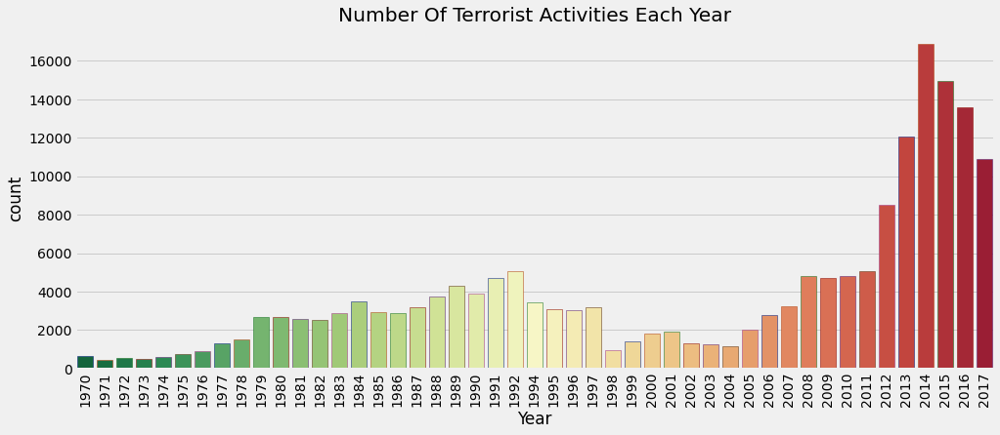

In [5]:
plt.subplots(figsize=(15,6))
sns.countplot('Year',data=global_terror,palette='RdYlGn_r',edgecolor=sns.color_palette('dark',7))
plt.xticks(rotation=90)
plt.title('Number Of Terrorist Activities Each Year')
plt.show()

In [6]:
print('Country with Highest Terrorist Attacks:',global_terror['Country'].value_counts().index[0])
print('Regions with Highest Terrorist Attacks:',global_terror['Region'].value_counts().index[0])

Country with Highest Terrorist Attacks: Iraq
Regions with Highest Terrorist Attacks: Middle East & North Africa


In [7]:
print('Maximum people killed in an attack are:',global_terror['Killed'].max(),'that took place in',global_terror.loc[global_terror['Killed'].idxmax()].Country)

Maximum people killed in an attack are: 1570.0 that took place in Iraq




- 2000 년도 이후 부터 테러리즘이 급격히 상승한 것을 볼 수 있다.
- 2001년에 발생한 미국 9/11 테러 이후로 전세계의 테러리즘이 상승한 것으로 보인다. 이유는 가장 많은 테러공격을 받은 나라로 이라크, 가장 많은 테러를 받은 지역으로는 중동과 북아프리카이다.

- 9/11 사건은 사우디 아라비아 출신인 오사마 빈 라덴이 창시한, 극단적 살라프파 무슬림에 알케에다로 시작하여 당시 미국 동부 상공을 비행하던 여객기 4대가 소규모 납치범들에 의해 동시에 납치됐다. 납치된 여객기들은 뉴욕과 워싱턴DC에 있는 랜드마크 건물들에 충돌하기 위한 일종의 거대 유도 미사일로 사용됐다. 이 중 여객기 2대는 뉴욕 맨해튼에 위치한 세계무역센터 쌍둥이 빌딩에 충돌했다. 9.11 테러로 총 2977명(19명의 납치범 제외)이 목숨을 잃었으며, 희생자 대부분은 뉴욕 거주자들이었다.

    - 4대의 비행기에 탑승한 승객과 승무원 246명 전원 사망
    - 쌍둥이 빌딩에서 2606명 사망 - 부상 등으로 사망
    - 펜타곤에서 125명 사망
- 이러한 테러 공격에 대해 미국의 대처?
    - 당시 조지 W. 부시 대통령은 테러 발생 한 달도 채 되지 않았을 때, 유엔(UN)의 지원을 받아 알카에다 척결과 빈 라덴 색출을 위해 아프간 침공을 주도했다.



### 테러가 많이 일어나 국가 정렬, 상위 10위 국가 시각화

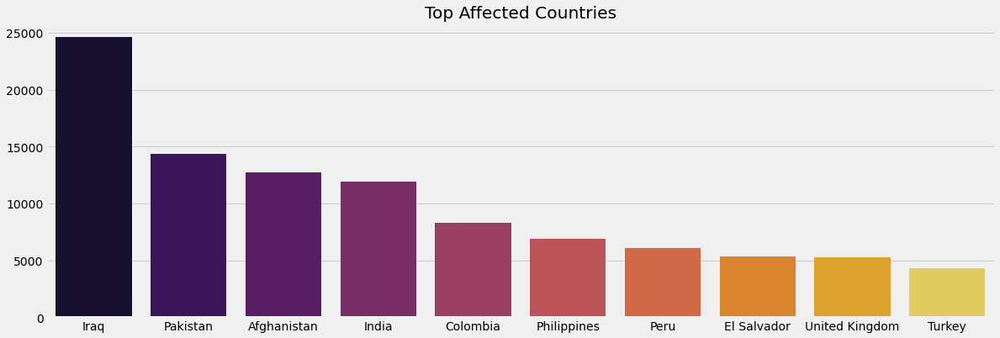

In [8]:
plt.subplots(figsize=(18,6))
sns.barplot(global_terror['Country'].value_counts()[:10].index, global_terror['Country'].value_counts()[:10].values,palette='inferno')
plt.title('Top Affected Countries')
plt.show()


### 테러가 많이 일어난 나라 분석
- 테러가 가장 많이 일어난 국가 10위는 이라크, 파키스탄, 아프가니스탄, 인도, 콜럼비아, 필리핀, 페루, 엘사바도르, 영국, 터키 순이다. 
- 이라크에 테러가 일어난 횟수는 약 25000으로 3,4위 지역의 약 2배 정도 될 정도로 압도적으로 테러가 많이 일어났다.

In [9]:
#나라별 도시 별 사망자 및 부상자
global_terror_folium = global_terror.copy()
global_terror_folium.dropna(subset = ["latitude", "longitude"], inplace =True)
location_folium = global_terror_folium[["latitude", "longitude"]][:5000]
country_folium = global_terror_folium["Country"][:5000]
city_folium = global_terror_folium["city"][:5000]
killed_folium = global_terror_folium["Killed"][:5000]
wound_folium = global_terror_folium["Wounded"][:5000]
def color_point(x):
    if x >= 30:
        color ="red"
    elif ((x>0 and x<30)):
        color = "blue"
    else:
        color = "green"
    return color
def point_size(x):
    if (x>30 and x<100):
        size = 2
    elif (x>= 100 and x<500):
        size = 8
    elif x >= 500:
        size = 16
    else: 
        size = 0.5
    return size

map2 = folium.Map(location=[30, 0], titles="CartoDB dark_matter", zoom_start = 2)
for point in location_folium.index:
    info = "<b>Country: </b>" +str(country_folium[point])+"<br><b>City:</b>: " +str(city_folium[point])+"<br><b>Killed</b>: "+str(killed_folium[point])+"<br><b>Wounded</b>: "+str(wound_folium[point])
    iframe = folium.IFrame(html=info, width=200, height=200)
    folium.CircleMarker(list(location_folium.loc[point].values), popup=folium.Popup(iframe), radius=point_size(killed_folium[point]), color=color_point(killed_folium[point])).add_to(map2)
map2
        

### 나라별 테러횟수와 사망자 비교

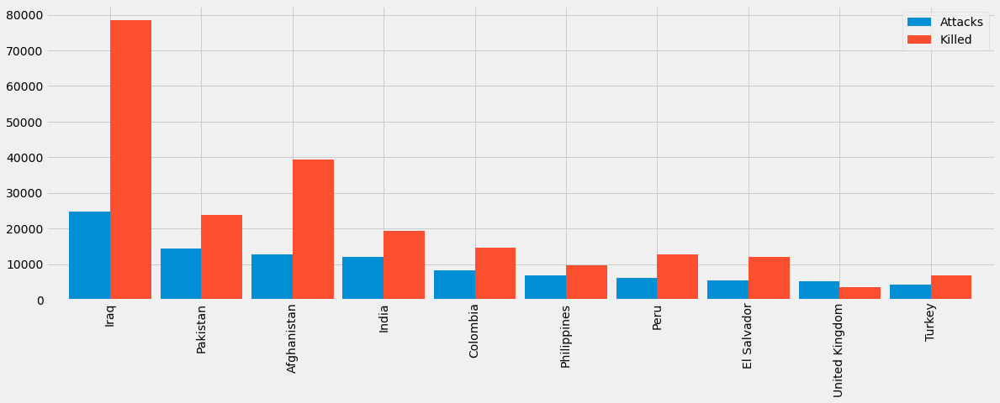

In [10]:
country_terror=global_terror['Country'].value_counts()[:10].to_frame()
country_terror.columns=['Attacks']
country_killed=global_terror.groupby('Country')['Killed'].sum().to_frame()
country_terror.merge(country_killed,left_index=True, right_index=True, how='left').plot.bar(width=0.9)
fig = plt.gcf()
fig.set_size_inches(18,6)
plt.show()

## 나라별 테러횟수와 사망자수를 바교하기 위해 상위 10개국을 비교할 경우
- 테러횟수와 사망자가 비슷한 나라는 없지만, 테러횟수에 비해 사망자 수가 적은 나라는 영국이다.
- 그외 나라는 테러횟수보다 사망자 수가 많다. 특히 이라크는 테러횟수에 비해 약 3배이상 더 많은 사망자수를 보이고 있고 두번째로 사망자 수가 많은 아프가니스탄보다 2배로 사망자 수가 많다.

## 나라별 테러횟수와 부상자 비교

In [11]:
country_terror=global_terror['Country'].value_counts()[:10].to_frame()
country_terror.columns=['Attacks']
country_wounded=global_terror.groupby('Country')['Wounded'].sum().to_frame()
country_terror.merge(country_wounded,left_index=True, right_index=True, how='left).plot.bar(width=0.9)
fig = plt.gcf()
fig.set_size_inches(18,6)
plt.show()

SyntaxError: EOL while scanning string literal (1272679054.py, line 4)

## 나라별 테러 횟수와 부상자 비교 
나라별 테러횟수와 부상자수를 바교하기 위해 상위 10개국을 비교할 경우:
- 테러횟수와 부상자가 비슷한 나라는 엘살바도르, 영국이다. 엘살바도르는 사망자 수가 부상자 수보다 높게 나온 것을 확인할 수 있다. 반면 영국은 부상자 수가 사망자 수보다 높게 나온 것을 확인할 수 있다.
- 테러횟수보다 부상자가 적은 나라는 페루이다. 그러나 페루는 사망자 수가 테러횟수보다 높게 나온 것을 확인할 수 있다. 
- 그외 나라는 테러횟수보다 부상자 수가 많다. 특히 이라크는 테러회숫에 비해 약 6배정도 많은 부상자 수를 보이며 두번째로 많은 부상자 수를 보이고 있는 아프가니스탄보다 약 3배이상 많은 부상자 수를 보인다. 



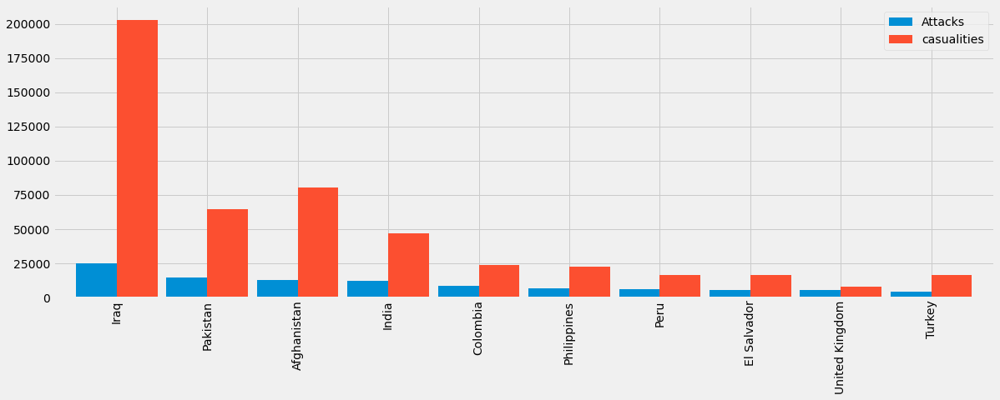

In [12]:
country_terror=global_terror['Country'].value_counts()[:10].to_frame()
country_terror.columns=['Attacks']
country_wounded=global_terror.groupby('Country')['casualities'].sum().to_frame()
country_terror.merge(country_wounded,left_index=True, right_index=True, how='left').plot.bar(width=0.9)
fig = plt.gcf()
fig.set_size_inches(18,6)
plt.show()


### 나라별 테러횟수와 사상자수를 바교하기 위해 상위 10개국을 비교

테러횟수와 사상자가 비슷하거나 적은 나라는 없으며 상위 10개국은 테러횟수보다 사상자 수가 많다.
특히 이라크는 테러회숫에 비해 약 8배정도 많은 사상자 수를 보이며 두번째로 많은 부상자 수를 보이고 있는 아프가니스탄보다 약 2배이상 많은 사상자 수를 보인다.

### 전체나라 테러 공격 형태 비교

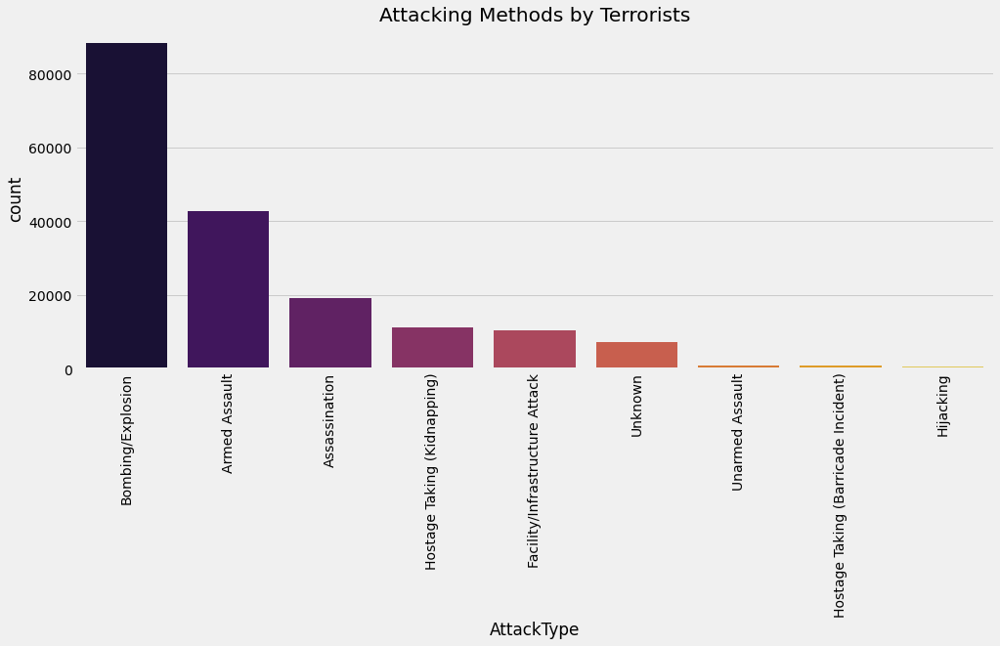

In [13]:
plt.subplots(figsize=(15,6))
sns.countplot('AttackType',data=global_terror,palette='inferno',order=global_terror['AttackType'].value_counts().index)
plt.xticks(rotation=90)
plt.title('Attacking Methods by Terrorists')
plt.show()

- 나라별 테러공격 형태는 폭탄/폭팔테러(Bombing/Explosion), 무장폭행(Armed Assault), 암살(Assissination), 인질/어린이납치(Hostage Taking_Kidnapping)순으로 가장 많다. 그 중 폭탄/폭팔테러횟수가 두번째로 많은 무장폭행횟수보다 2배로 많다.

In [14]:
# 테러로 인한 전체 사망자 수 출력: 총 441,868명
# Total Number of people killed in terror attack
killData = global_terror.loc[:,'Killed']
print('Number of people killed by terror attack:', int(sum(killData.dropna())))#결측치값 삭제/ drop the NaN values

Number of people killed by terror attack: 411868


In [15]:
# Let's look at what types of attacks these deaths were made of.
# 공격 타입 비교 
attackData = global_terror.loc[:,'AttackType']
# attackData
typeKillData = pd.concat([attackData, killData], axis=1)
typeKillData.head()


,AttackType,Killed
0,Assassination,1.0
1,Hostage Taking (Kidnapping),0.0
2,Assassination,1.0
3,Bombing/Explosion,NaN
4,Facility/Infrastructure Attack,NaN


In [16]:
typeKillFormatData = typeKillData.pivot_table(columns='AttackType', values='Killed', aggfunc='sum')
typeKillFormatData

AttackType,Armed Assault,Assassination,Bombing/Explosion,Facility/Infrastructure Attack,Hijacking,Hostage Taking (Barricade Incident),Hostage Taking (Kidnapping),Unarmed Assault,Unknown
Killed,160297.0,24920.0,157321.0,3642.0,3718.0,4478.0,24231.0,880.0,32381.0


In [17]:
import math
import plotly.offline as py
import plotly.graph_objs as go

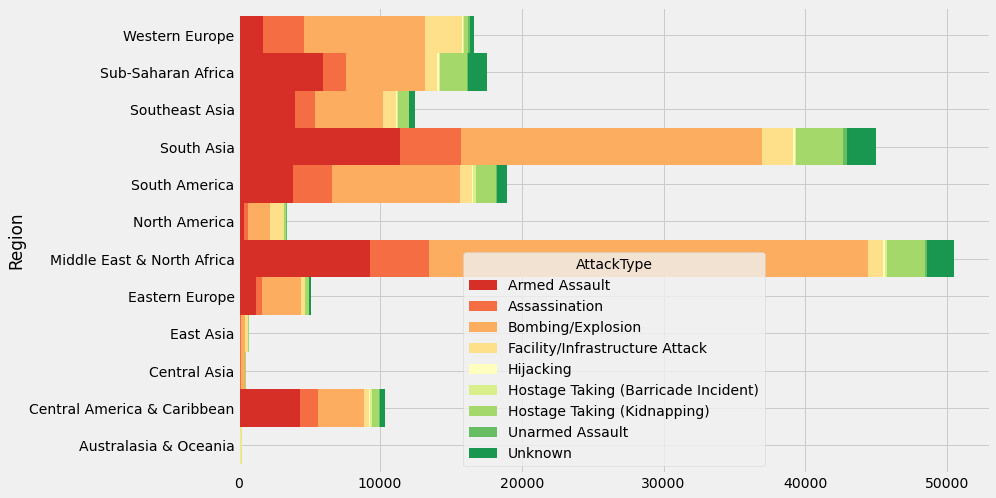

In [18]:
pd.crosstab(global_terror.Region,global_terror.AttackType).plot.barh(stacked=True,width=1,color=sns.color_palette('RdYlGn',9))
fig=plt.gcf()
fig.set_size_inches(12,8)
plt.show()

## 각 지역별로 테러 공격 형태 분석

가장 많은 테러 공격횟수를 가진 지역 별로 테러 공격 형태를 분석하니,대부분의 나라의 테러 공격 형태는 폭탄/폭팔테러(Bombing/Explosion), 무장폭행(Armed Assault), 암살(Assassination)순으로 가장 많다.
- 중동 & 북아프리카는 폭탄/폭팔테러(Bombing/Explosion), 무장폭행(Armed Assault), 암살(Assassination)순으로 가장 많다.
- 남아시아도 폭탄/폭팔테러(Bombing/Explosion), 무장폭행(Armed Assault), 암살(Assassination)순으로 가장 많다.

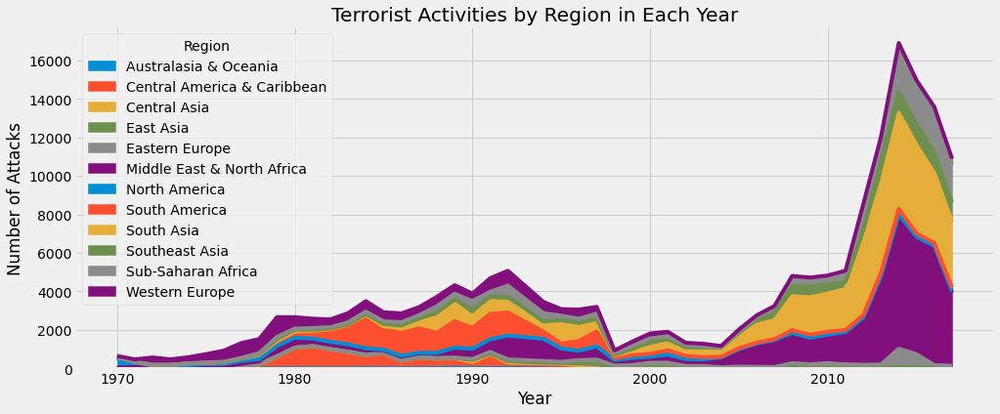

In [19]:
#연도 별 테러가 가장 많이 일어난 지역
pd.crosstab(global_terror.Year, global_terror.Region).plot(kind='area',figsize=(15,6))
plt.title('Terrorist Activities by Region in Each Year')
plt.ylabel('Number of Attacks')
plt.show()

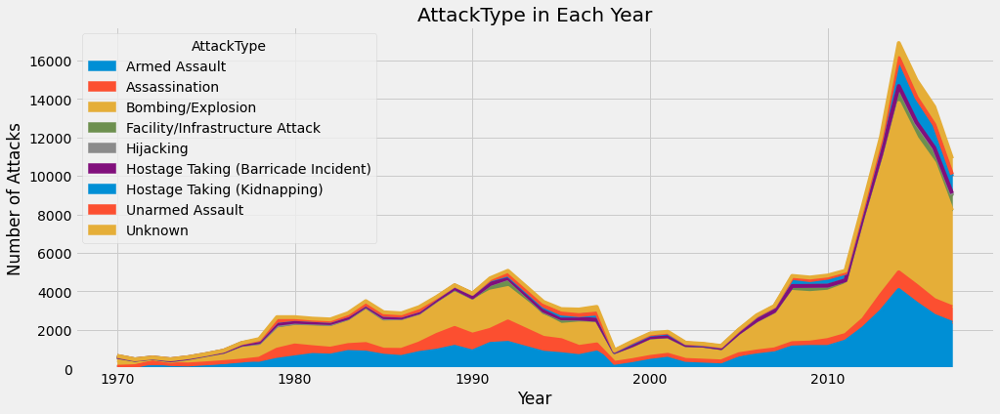

In [20]:
#연도 별 공격 타입
pd.crosstab(global_terror.Year, global_terror.AttackType).plot(kind='area',figsize=(15,6))
plt.title('AttackType in Each Year')
plt.ylabel('Number of Attacks')
plt.show()

In [21]:
#상위 40위 사상자(casualities)수 별로 정렬
terror1 = global_terror.sort_values(by='casualities',ascending=False)[:40]

In [22]:
#나라, 연도, 사상자별로 Pivot Table 생성
heat=terror1.pivot_table(index='Country',columns='Year',values='casualities')
heat.fillna(0,inplace=True)

In [23]:
#1982년도 부터 2016년도까지 가장 최악의 공격 타입 40위 *annotation display하기
colorscale = [[0, '#edf8fb'], [.3, '#00BFFF'],  [.6, '#8856a7'],  [1, '#810f7c']]
heatmap = go.Heatmap(z=heat.values, x=heat.columns, y=heat.index, colorscale=colorscale)
data = [heatmap]
layout = go.Layout(
    title='Top 40 Worst Terror Attacks in History from 1982 to 2016',
    xaxis = dict(ticks='', nticks=20),
    yaxis = dict(ticks='')
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='heatmap',show_link=False)

In [24]:
#연도 & 공격 타입 별 사상자 수 Pivot Table 생성
heat2=terror1.pivot_table(index='AttackType',columns='Year',values='casualities')
heat2.fillna(0,inplace=True)

In [25]:
# 1982 - 2016 별로 피해자 수 히트 맵
colorscale = [[0, '#edf8fb'], [.3, '#00BFFF'],  [.6, '#8856a7'],  [1, '#810f7c']]
heatmap2 = go.Heatmap(z=heat2.values, x=heat2.columns, y=heat2.index, colorscale=colorscale)
data = [heatmap2]
layout = go.Layout(
    title='Victims by Attacktypes(1982-2016)',
    xaxis = dict(ticks='', nticks=20),
    yaxis = dict(ticks='')
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='heatmap',show_link=False)



### 특정 시기를 기준으로 테러 양상 분석
- 문제1 (연도별 테러횟수) 분석을 통해 2000 년도 이후 부터 테러리즘이 급격히 상승한 것을 볼 수 있다. 2000년도 기준으로 테러의 양상을 분석할 경우, 2000년-2002년도 사이에 눈에 띄게 하이재킹(Hijacking), 운항 중인 항공기·선박 등을 납치,가 가장 많이 증가한 것을 볼 수 있다. 이는 2001년에 하이재킹이 발생한 미국 9/11 테러의 영향을 보여준다. 

## 중동&북아프리카, 남아시아, 서유럽, 남동아시아, 동유럽, 북아메리카, 동아시아 지역으로 구분하여 시대별 특성 분석

In [26]:
terror1 = global_terror.sort_values(by='casualities',ascending=False)[:30]

In [27]:
heat3=terror1.pivot_table(index='Region',columns='Year',values='casualities')
heat3.fillna(0,inplace=True)

In [28]:
colorscale = [[0, '#edf8fb'], [.3, '#00BFFF'],  [.6, '#8856a7'],  [1, '#810f7c']]
heatmap3 = go.Heatmap(z=heat3.values, x=heat3.columns, y=heat3.index, colorscale=colorscale)
data = [heatmap3]
layout = go.Layout(
    title='Victims from Each Region(1970-2016)',
    xaxis = dict(ticks='', nticks=20),
    yaxis = dict(ticks='')
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='heatmap',show_link=False)

## 1970년대 데이터 분석

In [29]:
#1970-1980년, 연도별
end_year = 1980
global_terror_1980 = global_terror.loc[(global_terror['Year'] < end_year)]
global_terror_1980

,Year,Month,Day,Country,Region,city,latitude,longitude,AttackType,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type,Motive,casualities
0,1970,7,2,Dominican Republic,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown,NaN,1.0
1,1970,0,0,Mexico,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown,NaN,0.0
2,1970,1,0,Philippines,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,Employee,NaN,Unknown,Journalists & Media,Unknown,NaN,1.0
3,1970,1,0,Greece,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,U.S. Embassy,NaN,Unknown,Government (Diplomatic),Explosives,NaN,NaN
4,1970,1,0,Japan,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,U.S. Consulate,NaN,Unknown,Government (Diplomatic),Incendiary,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9909,1979,12,28,El Salvador,Central America & Caribbean,San Salvador,13.692880,-89.199161,Armed Assault,3.0,0.0,convoy,NaN,Unknown,Military,Firearms,NaN,3.0
9910,1979,12,29,El Salvador,Central America & Caribbean,San Salvador,13.692880,-89.199161,Armed Assault,3.0,0.0,Metrocentro Commercial Complex,NaN,People's Liberation Forces (FPL),Business,Firearms,NaN,3.0
9911,1979,12,30,Iran,Middle East & North Africa,Tehran,35.724533,51.405190,Assassination,1.0,0.0,"Hossein Bagh-Sheni, Head of local notary publi...",NaN,Forqan Group,Business,Firearms,NaN,1.0
9912,1979,12,30,Turkey,Middle East & North Africa,Istanbul,41.106178,28.689863,Bombing/Explosion,NaN,NaN,Yesilkov Airport,NaN,Armenian Secret Army for the Liberation of Arm...,Airports & Aircraft,Explosives,NaN,NaN


In [30]:
#1970-1980년, 연도별 지역별 피해자 수 비교

terror_1980 = global_terror_1980.sort_values(by='casualities',ascending=False)[:10]

heat_1980=global_terror_1980.pivot_table(index='Region',columns='Year',values='casualities')
heat_1980.fillna(0,inplace=True)

colorscale = [[0, '#edf8fb'], [.3, '#00BFFF'],  [.6, '#8856a7'],  [1, '#810f7c']]
heatmap_1980 = go.Heatmap(z=heat_1980.values, x=heat_1980.columns, y=heat_1980.index, colorscale=colorscale)
data = [heatmap_1980]
layout = go.Layout(
    title='Victims from Each Region(1970)',
    xaxis = dict(ticks='', nticks=20),
    yaxis = dict(ticks='')
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='heatmap',show_link=False)

## 2000년도 이후 데이터 분석

In [31]:
start_year = 2000
global_terror_post = global_terror.loc[(global_terror['Year'] >= start_year)]
global_terror_post

,Year,Month,Day,Country,Region,city,latitude,longitude,AttackType,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type,Motive,casualities
69835,2000,1,1,Namibia,Sub-Saharan Africa,Muitjiku,-17.910812,19.988303,Armed Assault,0.0,7.0,A tavern in Muitjiku,01/01/2000: In the first of two related incide...,National Union for the Total Independence of A...,Business,Firearms,Unknown,7.0
69836,2000,1,1,Namibia,Sub-Saharan Africa,Muitjiku,-17.910812,19.988303,Hostage Taking (Kidnapping),0.0,7.0,The Bush Babies nightclub in Muitjiku,01/01/2000: In the second of two related incid...,National Union for the Total Independence of A...,Business,Firearms,Unknown,7.0
69837,2000,1,1,India,South Asia,Udhampur,32.925224,75.135264,Armed Assault,1.0,2.0,The Central Reserve Police Force 68 battalion ...,01/01/2000: Members of Lashkar-e Taiba attacke...,Lashkar-e-Taiba (LeT),Police,Firearms,Unknown,3.0
69838,2000,1,1,Kosovo,Eastern Europe,Peje,42.659809,20.307119,Bombing/Explosion,0.0,1.0,"A Romany (gypsy) home in Pec, Kosovo","01/01/2000: A Romany (gypsy) house in Pec, Kos...",Unknown,Private Citizens & Property,Explosives,Unknown,1.0
69839,2000,1,1,Somalia,Sub-Saharan Africa,Mogadishu,2.059819,45.326115,Armed Assault,6.0,10.0,Milk traders traveling from Mogadishu,01/01/2000: Over six people were killed and te...,Unknown,Private Citizens & Property,Firearms,It was possible the attack was a form of clan-...,16.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181686,2017,12,31,Somalia,Sub-Saharan Africa,Ceelka Geelow,2.359673,45.385034,Armed Assault,1.0,2.0,Checkpoint,12/31/2017: Assailants opened fire on a Somali...,Al-Shabaab,Military,Firearms,NaN,3.0
181687,2017,12,31,Syria,Middle East & North Africa,Jableh,35.407278,35.942679,Bombing/Explosion,2.0,7.0,Hmeymim Air Base,12/31/2017: Assailants launched mortars at the...,Muslim extremists,Military,Explosives,NaN,9.0
181688,2017,12,31,Philippines,Southeast Asia,Kubentog,6.900742,124.437908,Facility/Infrastructure Attack,0.0,0.0,Houses,12/31/2017: Assailants set fire to houses in K...,Bangsamoro Islamic Freedom Movement (BIFM),Private Citizens & Property,Incendiary,NaN,0.0
181689,2017,12,31,India,South Asia,Imphal,24.798346,93.940430,Bombing/Explosion,0.0,0.0,Office,12/31/2017: Assailants threw a grenade at a Fo...,Unknown,Government (General),Explosives,NaN,0.0


### 2000년도 이후 

In [32]:
terror_post = global_terror_post.sort_values(by='casualities',ascending=False)[:10]

In [33]:
heat_post=global_terror_post.pivot_table(index='Region',columns='Year',values='casualities')
heat_post.fillna(0,inplace=True)

In [34]:
#2000년도 이후 각 지역별 사상자
colorscale = [[0, '#edf8fb'], [.3, '#00BFFF'],  [.6, '#8856a7'],  [1, '#810f7c']]
heatmap_post = go.Heatmap(z=heat_post.values, x=heat_post.columns, y=heat_post.index, colorscale=colorscale)
data = [heatmap_post]
layout = go.Layout(
    title='Victims from Each Region(after 2000)',
    xaxis = dict(ticks='', nticks=20),
    yaxis = dict(ticks='')
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='heatmap_post',show_link=False)

In [35]:
heat_post_attacktype=global_terror_post.pivot_table(index='AttackType',columns='Year',values='casualities')[:30]
heat_post_attacktype.fillna(0,inplace=True)

In [36]:
#2000년대 이후 공격 타입 별 사상자
colorscale = [[0, '#edf8fb'], [.3, '#00BFFF'],  [.6, '#8856a7'],  [1, '#810f7c']]
heatmap_attacktype = go.Heatmap(z=heat_post_attacktype.values, x=heat_post_attacktype.columns, y=heat_post_attacktype.index, colorscale=colorscale)
data = [heatmap_attacktype]
layout = go.Layout(
    title='Victims by Attacktypes(after 2000)',
    xaxis = dict(ticks='', nticks=20),
    yaxis = dict(ticks='')
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='heatmap_attacktype',show_link=False)

### 2000년도 이후 데이터 분석 결과
- 2000년도 이후의 사상자는 북아메리카 지역이 가장 높게 보인다.
- 가장 많은 사상자를 만든 테러 타입은 2001-2001년도 사이에는 Hijacking이 가장 많은 사상자를 만들었고 2004-2005년도 사이에는 바리케이드 인질 사건이 가장 많은 사상자를 만들었다. 

### 2010년도 이후 데이터 분석

In [37]:
start_year = 2010
global_terror_present = global_terror.loc[(global_terror['Year'] >= start_year)]
global_terror_present

,Year,Month,Day,Country,Region,city,latitude,longitude,AttackType,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type,Motive,casualities
94875,2010,1,1,Afghanistan,South Asia,Dwah Mande,33.469444,69.620278,Bombing/Explosion,4.0,0.0,The vehicle,"01/01/2010: On Friday afternoon, in the Dwaman...",Taliban,Private Citizens & Property,Explosives,The specific motive for the attack is unknown.,4.0
94876,2010,1,1,Pakistan,South Asia,Orakzai district,33.697271,71.144852,Bombing/Explosion,0.0,0.0,A pro-government tribal elder's residence,"01/01/2010: On Friday, the residence of a pro-...",Tehrik-i-Taliban Pakistan (TTP),Private Citizens & Property,Explosives,The specific motive for the attack is unknown.,0.0
94877,2010,1,1,Pakistan,South Asia,Karachi,24.891115,67.143311,Bombing/Explosion,0.0,0.0,Civilians were the target of the attack.,"01/01/2010: On Friday, contradicting reports s...",Unknown,Private Citizens & Property,Explosives,The specific motive for the attack is unknown.,0.0
94878,2010,1,1,Pakistan,South Asia,Bajaur district,34.856902,71.429936,Bombing/Explosion,0.0,0.0,A primary school,"01/01/2010: On Friday late in the day, in one ...",Unknown,Educational Institution,Explosives,The specific motive for the attack is unknown.,0.0
94879,2010,1,1,Pakistan,South Asia,Bajaur district,34.856902,71.429936,Bombing/Explosion,0.0,0.0,A boy's high school was targeted in the attack.,"01/01/2010: On Friday late in the day, in one ...",Unknown,Educational Institution,Explosives,The specific motive for the attack is unknown.,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181686,2017,12,31,Somalia,Sub-Saharan Africa,Ceelka Geelow,2.359673,45.385034,Armed Assault,1.0,2.0,Checkpoint,12/31/2017: Assailants opened fire on a Somali...,Al-Shabaab,Military,Firearms,NaN,3.0
181687,2017,12,31,Syria,Middle East & North Africa,Jableh,35.407278,35.942679,Bombing/Explosion,2.0,7.0,Hmeymim Air Base,12/31/2017: Assailants launched mortars at the...,Muslim extremists,Military,Explosives,NaN,9.0
181688,2017,12,31,Philippines,Southeast Asia,Kubentog,6.900742,124.437908,Facility/Infrastructure Attack,0.0,0.0,Houses,12/31/2017: Assailants set fire to houses in K...,Bangsamoro Islamic Freedom Movement (BIFM),Private Citizens & Property,Incendiary,NaN,0.0
181689,2017,12,31,India,South Asia,Imphal,24.798346,93.940430,Bombing/Explosion,0.0,0.0,Office,12/31/2017: Assailants threw a grenade at a Fo...,Unknown,Government (General),Explosives,NaN,0.0


In [38]:
heat_post_2010=global_terror_present.pivot_table(index='Region',columns='Year',values='casualities')[:30]
heat_post_2010.fillna(0,inplace=True)
heat_post_2010

Year,2010,2011,2012,2013,2014,2015,2016,2017
Region,,,,,,,,
Australasia & Oceania,0.000000,0.000000,0.000000,0.000000,1.222222,0.142857,0.100000,2.545455
Central America & Caribbean,0.000000,2.000000,3.000000,0.857143,14.000000,0.000000,1.000000,1.250000
Central Asia,5.666667,1.777778,1.416667,0.571429,1.333333,2.500000,2.705882,1.857143
East Asia,21.000000,25.500000,21.333333,10.076923,19.047619,6.280000,9.500000,13.285714
Eastern Europe,3.348659,3.923469,2.970930,2.725610,2.616454,3.364055,1.659091,2.605505
Middle East & North Africa,7.225052,5.287980,6.549138,7.077539,5.589930,6.741303,7.080108,5.228182
North America,0.875000,0.272727,1.000000,19.250000,1.648649,2.145161,3.280000,11.206186
South America,1.398649,1.254717,4.909091,2.539326,1.793478,1.560694,1.694268,1.452381
South Asia,4.584053,4.273508,4.303088,4.008987,3.550379,4.099815,4.851560,5.030106


In [39]:
#2010년도 이후 각 지역별 사상자
colorscale = [[0, '#edf8fb'], [.3, '#00BFFF'],  [.6, '#8856a7'],  [1, '#810f7c']]
heatmap_post_2010 = go.Heatmap(z=heat_post_2010.values, x=heat_post_2010.columns, y=heat_post_2010.index, colorscale=colorscale)
data = [heatmap_post_2010]
layout = go.Layout(
    title='Victims of Each Region(after 2010)',
    xaxis = dict(ticks='', nticks=20),
    yaxis = dict(ticks='')
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='heatmap_attacktype2',show_link=False)

### 2010년도 이후 사상자 데이터 분석 결과
- 2010년도 이후의 사상자는 동아시아가 가장 많은 것으로 나타난다. 
- 가장 많은 사상자를 만든 테러 타입은 2001-2001년도 사이에는 Hijacking이 가장 많은 사상자를 만들었고 2004-2005년도 사이에는 바리케이드 인질 사건이 가장 많은 사상자를 만들었다. 

In [41]:
#연도 별 공격 타입 및 사상자 수
heat_post_attacktype2=global_terror_present.pivot_table(index='AttackType',columns='Year',values='casualities')[:30]
heat_post_attacktype2.fillna(0,inplace=True)

In [42]:
heat_post_attacktype2

Year,2010,2011,2012,2013,2014,2015,2016,2017
AttackType,,,,,,,,
Armed Assault,2.914260,2.884840,3.975500,3.740728,4.394128,4.965214,4.919252,5.140669
Assassination,3.328652,3.552941,2.077093,2.307784,2.029867,2.327511,2.102978,1.831475
Bombing/Explosion,7.031625,6.417127,5.550889,6.369572,5.179190,6.291547,6.366584,5.543012
Facility/Infrastructure Attack,0.439863,0.457627,0.621622,0.880357,0.391967,0.464646,0.538003,0.487705
Hijacking,0.538462,0.444444,2.200000,2.461538,1.121212,2.114286,1.352941,0.955556
Hostage Taking (Barricade Incident),41.625000,6.000000,6.529412,25.200000,19.264706,19.297297,16.901961,11.154930
Hostage Taking (Kidnapping),0.879487,0.886364,2.060345,2.388889,4.731092,3.531981,7.368671,3.964072
Unarmed Assault,9.476190,4.500000,43.178571,17.777778,5.714286,9.814815,10.000000,11.162500
Unknown,5.963964,5.783019,6.287500,4.429907,5.703340,7.013908,6.826597,7.250729


In [43]:
#2010년대 이후 연도 및 지역 별 공격 타입

colorscale = [[0, '#edf8fb'], [.3, '#00BFFF'],  [.6, '#8856a7'],  [1, '#810f7c']]
heatmap_attacktype2 = go.Heatmap(z=heat_post_attacktype2.values, x=heat_post_attacktype2.columns, y=heat_post_attacktype2.index, colorscale=colorscale)
data = [heatmap_attacktype2]
layout = go.Layout(
    title='Victims by Attacktypes(after 2010)',
    xaxis = dict(ticks='', nticks=20),
    yaxis = dict(ticks='')
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='heatmap_attacktype2',show_link=False)

### 2010년도 이후 공격 형태 데이터 분석 결과
- 2000년도 이후의 사상자는 북아메리카 지역이 가장 높게 보인다.
- 가장 많은 사상자를 만든 테러 타입은 2001-2001년도 사이에는 Hijacking이 가장 많은 사상자를 만들었고 2004-2005년도 사이에는 바리케이드 인질 사건이 가장 많은 사상자를 만들었다. 